In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


## Fine-tune TrOCR on the IAM Handwriting Database

In this notebook, we are going to fine-tune a pre-trained TrOCR model on the [IAM Handwriting Database](https://fki.tic.heia-fr.ch/databases/iam-handwriting-database), a collection of annotated images of handwritten text.

We will do this using the new `VisionEncoderDecoderModel` class, which can be used to combine any image Transformer encoder (such as ViT, BEiT) with any text Transformer as decoder (such as BERT, RoBERTa, GPT-2). TrOCR is an instance of this, as it has an encoder-decoder architecture, with the weights of the encoder initialized from a pre-trained BEiT, and the weights of the decoder initialized from a pre-trained RoBERTa. The weights of the cross-attention layer were randomly initialized, before the authors pre-trained the model further on millions of (partially synthetic) annotated images of handwritten text.

This figure gives a good overview of the model (from the original paper):

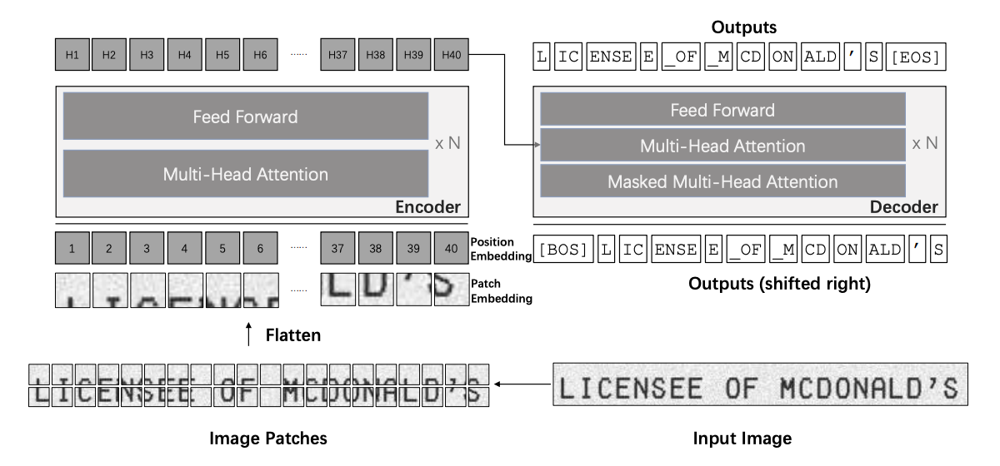

* TrOCR paper: https://arxiv.org/abs/2109.10282
* TrOCR documentation: https://huggingface.co/transformers/master/model_doc/trocr.html


Note that Patrick also wrote a very good [blog post](https://huggingface.co/blog/warm-starting-encoder-decoder) on warm-starting encoder-decoder models (which is what the TrOCR authors did). This blog post was very helpful for me to create this notebook.

We will fine-tune the model using the Seq2SeqTrainer, which is a subclass of the 🤗 Trainer that lets you compute generative metrics such as BLEU, ROUGE, etc by doing generation (i.e. calling the `generate` method) inside the evaluation loop.



## Set-up environment

First, let's install the required libraries:
* Transformers (for the TrOCR model)
* Datasets & Jiwer (for the evaluation metric)

We will not be using HuggingFace Datasets in this notebook for data preprocessing, we will just create a good old basic PyTorch Dataset.

In [ ]:
from google.colab import files
files.upload()  # Upload kaggle.json file here


In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d sabarinathan/tamil-offline-handwritten-word-recognition


Dataset URL: https://www.kaggle.com/datasets/sabarinathan/tamil-offline-handwritten-word-recognition
License(s): MIT
100% 4.76G/4.77G [01:12<00:00, 118MB/s]
100% 4.77G/4.77G [01:12<00:00, 70.9MB/s]


In [ ]:
!pip install git+https://github.com/huggingface/transformers

  Cloning https://github.com/huggingface/transformers to /tmp/pip-req-build-a3quzyrp
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers /tmp/pip-req-build-a3quzyrp
  Resolved https://github.com/huggingface/transformers to commit 98bad9c6d6c9ac98b42164fd882f94d4b5bfa4d7
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 37.3 MB/s eta 0:00:00
  Created wheel for transformers: filename=transformers-4.46.0.dev0-py3-none-any.whl size=10008418 sha256=c0a4fa31ad3bbfba7b6d717a26e2dbd6f5b687c7cb325a7643577ce612e0178e
  Stored in directory: /tmp/pip-ephem-wheel-cache-ab7uvbal/wheels/c0/14/d6/6c9a5582d2ac191ec0a483be151a4495fe1eb2a6706ca49f1b
Successfully built transformers
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.19.1
    Uninstalling tokenizers-0.19.1:
      Successfully 

In [ ]:
#!pip install -q transformers
!pip install -q sentencepiece
!pip install -q jiwer
!pip install -q datasets
!pip install -q evaluate
!pip install -q -U accelerate


!pip install -q matplotlib
!pip install -q protobuf==3.20.1
!pip install -q tensorboard
!pip install --upgrade "pyarrow>=14.0.1,<15.0.0a0"


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.9/330.9 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-ai-generativelanguage 0.6.6 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 3.20.1 which is incompa

In [ ]:
import os
import os
import torch
import evaluate
import numpy as np
import pandas as pd
import glob as glob
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.transforms as transforms


from PIL import Image
from zipfile import ZipFile
from tqdm.notebook import tqdm
from dataclasses import dataclass
from torch.utils.data import Dataset
from urllib.request import urlretrieve
from transformers import (
    VisionEncoderDecoderModel,
    TrOCRProcessor,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    default_data_collator
)

In [ ]:
def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assets....", end="")


    # Downloading zip file using urllib package.
    urlretrieve(url, save_path)


    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])


        print("Done")


    except Exception as e:
        print("\nInvalid file.", e)


#URL = r"https://www.dropbox.com/scl/fi/vyvr7jbdvu8o174mbqgde/scut_data.zip?rlkey=fs8axkpxunwu6if9a2su71kxs&dl=1"
#asset_zip_path = os.path.join(os.getcwd(), "scut_data.zip")

# Download if asset ZIP does not exist.
#if not os.path.exists(asset_zip_path):
#    download_and_unzip(URL, asset_zip_path)

In [ ]:
import gc
import torch
gc.collect()  # Collect garbage objects
torch.cuda.empty_cache()  # Release unused cached memo

In [ ]:
!unzip -uq "/content/tamil-offline-handwritten-word-recognition.zip" -d "/content/"


In [ ]:
import pandas as pd

train_df = pd.read_csv("/content/train.csv")

train_df.head()

,file_name,text
0,train/1.jpg,தொடர்ந்தபடிதான்
1,train/2.jpg,பேரியக்கத்தினரும்
2,train/3.jpg,இவைகளை
3,train/4.jpg,விபூதியுமாகக்
4,train/5.jpg,ஆராய்ந்து


In [ ]:
train_filenames = [name.split("/")[-1]  for name in train_df.file_name.values]
train_df["file_name"] = train_filenames
train_df.head()

,file_name,text
0,1.jpg,தொடர்ந்தபடிதான்
1,2.jpg,பேரியக்கத்தினரும்
2,3.jpg,இவைகளை
3,4.jpg,விபூதியுமாகக்
4,5.jpg,ஆராய்ந்து


In [ ]:
train_df.shape

(75736, 2)

In [ ]:
test_df = pd.read_csv("/content/val.csv")

test_df.head()

,file_name,text
0,val/1.jpg,ஆச்சரியமாய்ச்
1,val/2.jpg,கூட்டுகிறார்
2,val/3.jpg,இஞ்சினியரிங்
3,val/4.jpg,யூனியன்
4,val/5.jpg,வரப்போக


In [ ]:
test_filenames = [name.split("/")[-1]  for name in test_df.file_name.values]
test_df["file_name"] = test_filenames
test_df.head()

,file_name,text
0,1.jpg,ஆச்சரியமாய்ச்
1,2.jpg,கூட்டுகிறார்
2,3.jpg,இஞ்சினியரிங்
3,4.jpg,யூனியன்
4,5.jpg,வரப்போக


In [ ]:
import pandas as pd

# Sample DataFrame
#data = {'text': ['hello', '   ', '', 'world', None, '  test  ', '\t', '']}
df = test_df # pd.DataFrame(data)

# Check if the 'text' column contains only empty or whitespace characters
empty_rows = df[df['text'].apply(lambda x: x is None or x.strip() == '')]

# Store rows in a list
empty_rows_list = empty_rows.to_dict(orient='records')

# Print each row
for index, row in empty_rows.iterrows():
    print(f"Row {index}: {row['text']}")

# Print the list
print("\nList of rows:")
print(empty_rows_list)



List of rows:
[]


In [ ]:
@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:    int = 32
    EPOCHS:        int = 5  # 35
    LEARNING_RATE: float = 0.00001 #0.00005

@dataclass(frozen=True)
class DatasetConfig:
    DATA_ROOT:     str = '/content/'

@dataclass(frozen=True)
class ModelConfig:
    MODEL_NAME: str = 'microsoft/trocr-base-stage1' #'microsoft/trocr-small-printed'

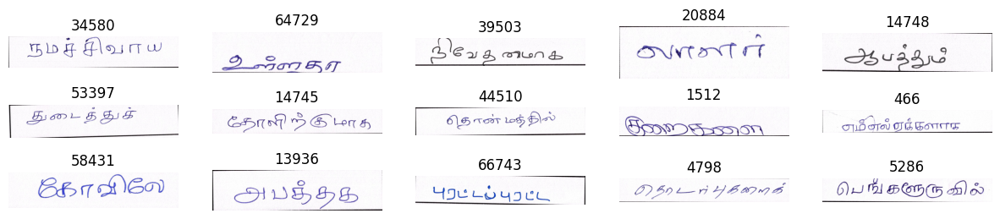

In [ ]:
def visualize(dataset_path):
    plt.figure(figsize=(15, 3))
    for i in range(15):
        plt.subplot(3, 5, i+1)
        all_images = os.listdir("/content/ta/train/train")
        image = plt.imread("/content/ta/train/train/"+all_images[i])
        plt.imshow(image)
        plt.axis('off')
        plt.title(all_images[i].split('.')[0])
    plt.show()


visualize(DatasetConfig.DATA_ROOT)

In [ ]:
# Find rows where the 'text' column is empty or null
empty_text_rows = test_df[test_df['text'].isnull() | (test_df['text'] == ' ')]

# Print the row indices of rows with empty text
print("Rows with empty text:")
print(empty_text_rows.index)

# Print the size of the DataFrame
print("\nSize of the DataFrame (rows, columns):", test_df.shape)


Rows with empty text:
Index([], dtype='int64')

Size of the DataFrame (rows, columns): (11598, 2)


In [ ]:
"""
train_df = pd.read_fwf(
    os.path.join(DatasetConfig.DATA_ROOT, 'scut_train.txt'), header=None
)
train_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)
test_df = pd.read_fwf(
    os.path.join(DatasetConfig.DATA_ROOT, 'scut_test.txt'), header=None
)
test_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)

"""

"\ntrain_df = pd.read_fwf(\n    os.path.join(DatasetConfig.DATA_ROOT, 'scut_train.txt'), header=None\n)\ntrain_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)\ntest_df = pd.read_fwf(\n    os.path.join(DatasetConfig.DATA_ROOT, 'scut_test.txt'), header=None\n)\ntest_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)\n\n"

In [ ]:
# Augmentations.
train_transforms = transforms.Compose([
    transforms.ColorJitter(brightness=.5, hue=.3),
    transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
])

In [ ]:
class CustomOCRDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=512):
        self.root_dir = root_dir
        self.df = df
        self.processor = processor
        self.max_target_length = max_target_length
        self.tokenizer = tokenizer


    def __len__(self):
        return len(self.df)


    def __getitem__(self, idx):
        # The image file name.
        file_name = self.df['file_name'][idx]
        # The text (label).
        text = self.df['text'][idx]
        # Read the image, apply augmentations, and get the transformed pixels.
        image = Image.open(self.root_dir + file_name).convert('RGB')
        image = train_transforms(image)
        pixel_values = self.processor(image, return_tensors='pt').pixel_values
        # Pass the text through the tokenizer and get the labels,
        # i.e. tokenized labels.
        labels = self.processor.tokenizer(
            text,
            padding='max_length',
            max_length=self.max_target_length
        ).input_ids
        # We are using -100 as the padding token.
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]
        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        return encoding

class IAMDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=128):
        self.root_dir = root_dir
        self.df = df
        self.processor = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # get file name + text
        file_name = self.df['file_name'][idx]
        text = self.df['text'][idx]
        # prepare image (i.e. resize + normalize)
        image = Image.open(self.root_dir + file_name).convert("RGB")
        pixel_values = self.processor(image, return_tensors="pt").pixel_values
        # add labels (input_ids) by encoding the text
        labels = self.processor.tokenizer(text, padding="max_length",max_length=self.max_target_length).input_ids
        # important: make sure that PAD tokens are ignored by the loss function
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        return encoding

In [ ]:
from transformers import AutoFeatureExtractor, AutoTokenizer
from transformers import TrOCRProcessor, VisionEncoderDecoderModel

encode = 'google/vit-base-patch16-224-in21k' # facebook/deit-tiny-patch16-224" #
decode = "d42kw01f/Tamil-RoBERTa" #'flax-community/roberta-hindi'

feature_extractor = AutoFeatureExtractor.from_pretrained(encode) #"google/vit-base-patch16-384")
decoder_tokenizer = AutoTokenizer.from_pretrained(decode) #"l3cube-pune/tamil-bert") #d42kw01f/Tamil-RoBERTa
processor =TrOCRProcessor(feature_extractor=feature_extractor, tokenizer=decoder_tokenizer)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/604k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/339k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/trocr/processing_trocr.py:47: FutureWarning: The `feature_extractor` argument is deprecated and will be removed in v5, use `image_processor` instead.
  warnings.warn(


In [ ]:
label_lengths = []
for text in train_df["text"]:
    tokenized_text = processor.tokenizer(text, add_special_tokens=False).input_ids  # Tokenize the text
    label_lengths.append(len(tokenized_text))  # Get the length of the tokenized text

# Calculate statistics
max_length = max(label_lengths)
avg_length = sum(label_lengths) / len(label_lengths)
percentile_95 = np.percentile(label_lengths, 95)

print(f"Max Length: {max_length}")
print(f"Average Length: {avg_length}")
print(f"95th Percentile: {percentile_95}")

Max Length: 28
Average Length: 8.360885180099292
95th Percentile: 14.0


In [ ]:
tokenizer = AutoTokenizer.from_pretrained(decode) #"l3cube-pune/tamil-bert")
#processor.tokenizer = tokenizer

labels = tokenizer(
        "ஆச்சரியமாய்ச்",
        padding='max_length',
        max_length=16 #self.max_target_length
    ).input_ids

In [ ]:
#processor.save_pretrained('./processor')


In [ ]:
print("tamil tokenized: ", labels)

tamil tokenized:  [0, 2254, 263, 428, 266, 347, 270, 277, 263, 286, 263, 2, 1, 1, 1, 1]


In [ ]:
#labels = encoding['labels']
labels[labels == -100] = processor.tokenizer.pad_token_id
label_str = processor.decode(labels, skip_special_tokens=True)
print(label_str)

ஆச்சரியமாய்ச்


In [ ]:
len(train_df)*.5 , len(train_df)*.5 /24,len(test_df)*.5 , len(test_df)*.5 /24

(37868.0, 1577.8333333333333, 5799.0, 241.625)

In [ ]:
train_small = train_df #[0:2400]
test_df_small = test_df# [0:360]

In [ ]:
print(len(train_small), len(test_df_small))

75736 11598


In [ ]:
from transformers import AutoTokenizer

from transformers import TrOCRProcessor


train_dataset = IAMDataset(
    root_dir=os.path.join(DatasetConfig.DATA_ROOT, '/ta/train/train/'),
    df=train_small,
    processor=processor)
valid_dataset = IAMDataset(
    root_dir=os.path.join(DatasetConfig.DATA_ROOT, '/ta/val/val/'),
    df=test_df_small,
    processor=processor
)

In [ ]:

model = VisionEncoderDecoderModel.from_pretrained("sabaridsnfuji/Tamil_Offline_Handwritten_OCR")

#model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(encode, decode)


config.json:   0%|          | 0.00/4.87k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/670M [00:00<?, ?B/s]

VisionEncoderDecoderModel has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


generation_config.json:   0%|          | 0.00/256 [00:00<?, ?B/s]

In [ ]:

model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
print(f"processor.tokenizer.pad_token_id: {processor.tokenizer.pad_token_id}")
model.config.vocab_size = model.config.decoder.vocab_size
# config_decoder.is_decoder = True
# config_decoder.add_cross_attention = True

# set beam search parameters
model.config.eos_token_id = processor.tokenizer.sep_token_id
model.config.max_length = 64
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4

processor.tokenizer.pad_token_id: 1


In [ ]:

model.to(device)
print(model)
# Total parameters and trainable parameters.
total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_featur

In [ ]:
cer_metric = evaluate.load('cer')


class Metrics:
    def __init__(self, processor):
        self.cer_metric = evaluate.load('cer') #load_metric("cer")
        self.processor = processor

    def compute_metrics(self, pred):
        label_ids = pred.label_ids
        pred_ids = pred.predictions
        print(label_ids.shape, pred_ids.shape)

        pred_str = self.processor.batch_decode(pred_ids, skip_special_tokens=True)
        label_ids[label_ids == -100] = self.processor.tokenizer.pad_token_id
        label_str = self.processor.batch_decode(label_ids, skip_special_tokens=True)

        pred_str = np.array(["".join(text.split()) for text in pred_str])
        label_str = np.array(["".join(text.split()) for text in label_str])

        results = {}
        try:
            results["cer"] = self.cer_metric.compute(predictions=pred_str, references=label_str)
        except Exception as e:
            print(e)
            print(pred_str)
            print(label_str)
            results["cer"] = 0
        results["accuracy"] = (pred_str == label_str).mean()

        return results


def compute_metrics_hindi(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)
    return {"cer": cer}


In [ ]:
training_args = Seq2SeqTrainingArguments(
    num_train_epochs=50,
    predict_with_generate=True,
    evaluation_strategy="steps",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    output_dir="/content/seq_tocr_tamil/",
    #output_dir="./",
    logging_steps=2,
    save_steps=1000,
    eval_steps=100,
)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1559: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
metrics = Metrics(processor)

# Initialize trainer.
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.feature_extractor,
    args=training_args,
    compute_metrics=metrics.compute_metrics,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    data_collator=default_data_collator
)


res = trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/models/trocr/processing_trocr.py:137: FutureWarning: `feature_extractor` is deprecated and will be removed in v5. Use `image_processor` instead.
  warnings.warn(
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.


Step,Training Loss,Validation Loss,Cer,Accuracy
100,0.086000,0.229104,0.114214,0.636230
200,0.097000,0.219026,0.105437,0.654941
300,0.081000,0.216402,0.096783,0.669771
400,0.129300,0.206482,0.097630,0.673392
500,0.099700,0.216071,0.100020,0.667960
600,0.127700,0.208577,0.095662,0.673909
700,0.129400,0.204223,0.091622,0.674944
800,0.114400,0.206472,0.095689,0.673478
900,0.110900,0.207840,0.093633,0.677875
1000,0.101800,0.204568,0.091587,0.679083


(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:2634: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 64, 'early_stopping': True, 'num_beams': 4, 'length_penalty': 2.0, 'no_repeat_ngram_size': 3}. You are seeing this warning because you've set generation parameters in the model config, as opposed to in the generation config.
  warnings.warn(


(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)


Step,Training Loss,Validation Loss,Cer,Accuracy
100,0.086000,0.229104,0.114214,0.636230
200,0.097000,0.219026,0.105437,0.654941
300,0.081000,0.216402,0.096783,0.669771
400,0.129300,0.206482,0.097630,0.673392
500,0.099700,0.216071,0.100020,0.667960
600,0.127700,0.208577,0.095662,0.673909
700,0.129400,0.204223,0.091622,0.674944
800,0.114400,0.206472,0.095689,0.673478
900,0.110900,0.207840,0.093633,0.677875
1000,0.101800,0.204568,0.091587,0.679083


(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)
(11598, 128) (11598, 64)


KeyboardInterrupt: 

In [ ]:
# prompt: can you save the checkpoint of the trained model in tocr_temp1 folder

trainer.save_model("/content/tocr_temp1")


In [ ]:
# prompt: save the "model" file ./tocr_temp/ path

!mkdir -p ./tocr_temp/
model.save_pretrained("/content/tocr_temp")


In [ ]:

import shutil

# Path to the folder you want to zip
folder_to_zip = "/content/tocr_temp/"
output_filename = "/content/gdrive/MyDrive/handwritten_ocr/tocr_vit-base-patch16-224-cer-0.076043.zip"

# Zip the folder
shutil.make_archive(output_filename.replace('.zip', ''), 'zip', folder_to_zip)

print("Zipping completed. Saved as:", output_filename)


Zipping completed. Saved as: /content/gdrive/MyDrive/handwritten_ocr/tocr_vit-base-patch16-224-cer-0.076043.zip


In [ ]:
"""
from transformers import AutoFeatureExtractor, AutoTokenizer
from transformers import TrOCRProcessor, VisionEncoderDecoderModel

feature_extractor = AutoFeatureExtractor.from_pretrained("google/vit-base-patch16-384")
decoder_tokenizer = AutoTokenizer.from_pretrained("l3cube-pune/tamil-bert") #d42kw01f/Tamil-RoBERTa
processor =TrOCRProcessor(feature_extractor=feature_extractor, tokenizer=decoder_tokenizer)
processor.save_pretrained('./processor')
processor = TrOCRProcessor.from_pretrained("./processor")
"""

In [ ]:
# testing code
#processor = TrOCRProcessor.from_pretrained(ModelConfig.MODEL_NAME)
trained_model1 = VisionEncoderDecoderModel.from_pretrained('/content/tocr_temp/', early_stopping=False).to(device)


In [ ]:
def read_and_show(image_path):
    """
    :param image_path: String, path to the input image.


    Returns:
        image: PIL Image.
    """
    image = Image.open(image_path).convert('RGB')
    return image

In [ ]:
def ocr(image, processor, model):
    """
    :param image: PIL Image.
    :param processor: Huggingface OCR processor.
    :param model: Huggingface OCR model.


    Returns:
        generated_text: the OCR'd text string.
    """
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)

    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

    return generated_text

In [ ]:
def ocr_new(image, processor, model):
    """
    :param image: PIL Image.
    :param processor: Huggingface OCR processor.
    :param model: Huggingface OCR model.


    Returns:
        generated_text: the OCR'd text string.
    """
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)

    # Get the decoder start token ID
    decoder_start_token_id = model.config.decoder_start_token_id \
        if model.config.decoder_start_token_id is not None \
        else processor.tokenizer.bos_token_id

    # Pass the decoder_start_token_id to the generate function
    generated_ids = model.generate(pixel_values, decoder_start_token_id=decoder_start_token_id)
    print(generated_ids)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

    return generated_text

In [ ]:
!sudo apt install fonts-noto

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-noto-cjk fonts-noto-cjk-extra fonts-noto-color-emoji fonts-noto-core
  fonts-noto-extra fonts-noto-mono fonts-noto-ui-core fonts-noto-ui-extra
  fonts-noto-unhinted
The following NEW packages will be installed:
  fonts-noto fonts-noto-cjk fonts-noto-cjk-extra fonts-noto-color-emoji
  fonts-noto-core fonts-noto-extra fonts-noto-mono fonts-noto-ui-core
  fonts-noto-ui-extra fonts-noto-unhinted
0 upgraded, 10 newly installed, 0 to remove and 49 not upgraded.
Need to get 317 MB of archives.
After this operation, 789 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-core all 20201225-1build1 [12.2 MB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-noto all 20201225-1build1 [16.8 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-cjk all 1:

In [ ]:
from matplotlib.font_manager import FontProperties

font_tamil = FontProperties(fname='/usr/share/fonts/truetype/noto/NotoSansTamil-Regular.ttf', size=20)


In [ ]:
import matplotlib.font_manager as fm

# Find the Tamil font path
tamil_font_paths = fm.findSystemFonts(fontpaths=None, fontext='ttf')
tamil_font_paths = [font for font in tamil_font_paths if 'NotoSansTamil-Regular' in font]
tamil_font_paths

['/usr/share/fonts/truetype/noto/NotoSansTamil-Regular.ttf']

Found 75736 images.


  0%|          | 0/50 [00:00<?, ?it/s]

tensor([[  0,   0, 307, 263, 290, 266, 275, 263, 316, 266, 274, 266, 269, 265,
         289, 263, 268, 265,   2]], device='cuda:0')


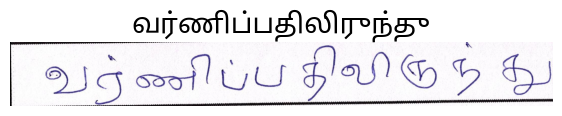

tensor([[  0,   0, 275, 265, 267, 276, 275, 263, 881, 263,   2]],
       device='cuda:0')


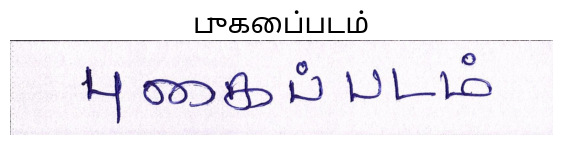

tensor([[  0,   0, 267, 270, 290, 263, 395, 266, 268, 265,   2]],
       device='cuda:0')


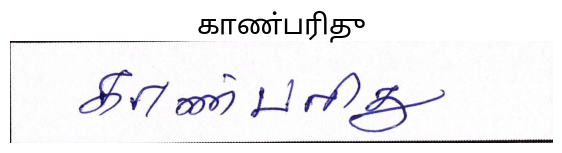

tensor([[  0,   0, 268, 294, 269, 266, 424, 263,   2]], device='cuda:0')


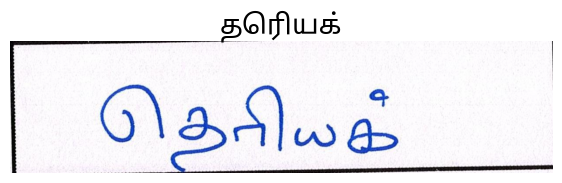

tensor([[   0,    0, 3509,  296, 1109,  263,    2]], device='cuda:0')


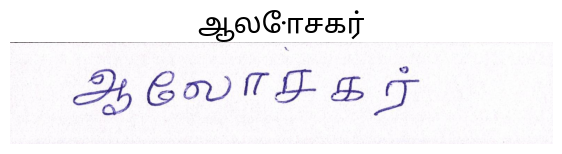

tensor([[  0,   0, 280, 287, 274, 276, 277, 270, 267, 263, 267, 266, 267, 263,
           2]], device='cuda:0')


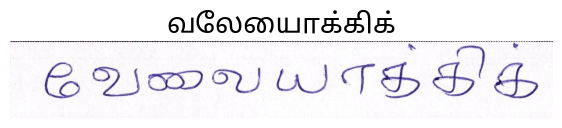

tensor([[   0,    0, 9556,  263,    2]], device='cuda:0')


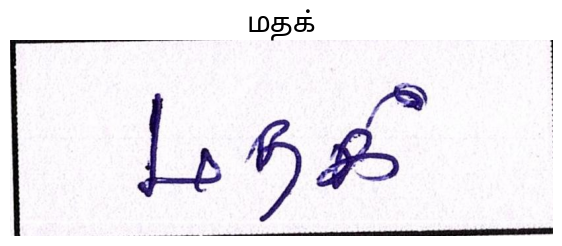

tensor([[   0,    0,  275,  300,  269,  265,  278,  265, 1805,  263,  268,  266,
          274,  263,    2]], device='cuda:0')


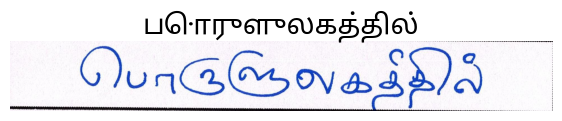

tensor([[   0,    0, 2000,  263,  335,  270,  272,  263,    2]],
       device='cuda:0')


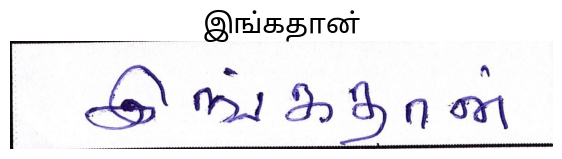

tensor([[  0,   0, 267, 296, 301, 266, 267, 263, 267, 296, 271, 265,   2]],
       device='cuda:0')


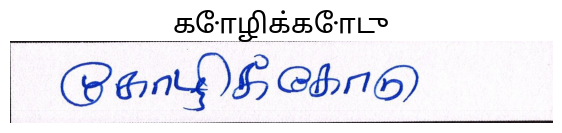

tensor([[   0,    0, 5796,  266,  481,  263,  285,  266,  274,  265,  273,  263,
            2]], device='cuda:0')


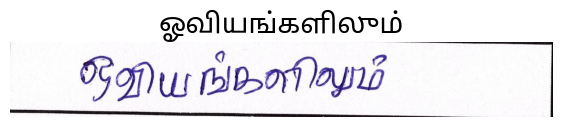

tensor([[   0,    0,  395,  266, 2422,  270,  280,  276,    2]],
       device='cuda:0')


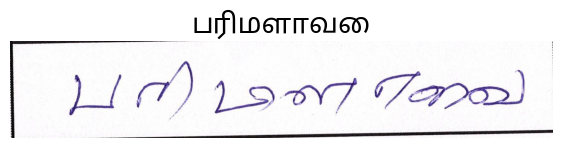

tensor([[   0,    0, 1163,  276,  275,  263,  275,  266,  272,  263,    2]],
       device='cuda:0')


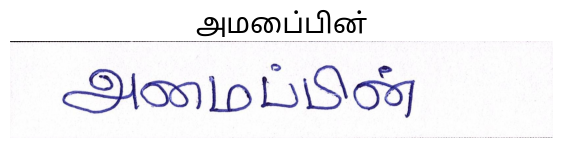

tensor([[  0,   0, 844, 263, 268, 266, 358, 263, 285, 263,   2]],
       device='cuda:0')


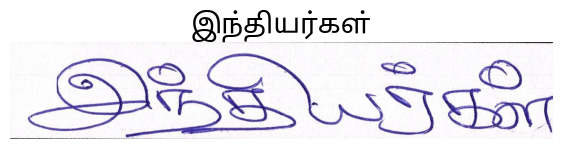

tensor([[  0,   0, 286, 287, 274, 266, 267, 263, 267, 265, 269, 266, 345, 265,
           2]], device='cuda:0')


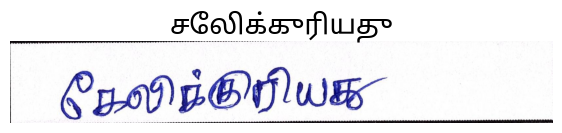

tensor([[  0,   0, 275, 270, 274, 265, 267, 263, 267, 265,   2]],
       device='cuda:0')


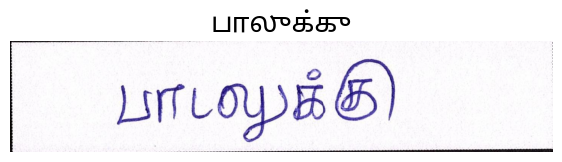

tensor([[   0,    0,  267,  287, 1659,  270,  272,    2]], device='cuda:0')


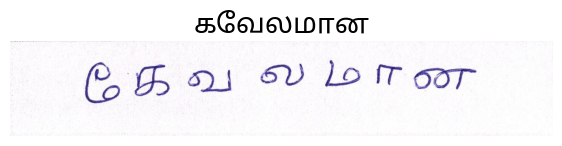

tensor([[  0,   0, 275, 266, 269, 270, 272, 263, 286, 266, 272, 263,   2]],
       device='cuda:0')


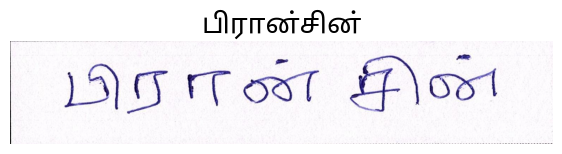

tensor([[  0,   0, 472, 265, 273, 276, 277, 270, 335, 263,   2]],
       device='cuda:0')


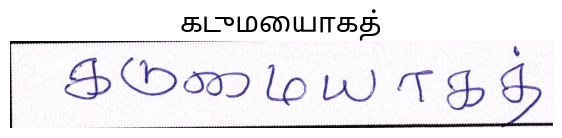

tensor([[  0,   0, 289, 287, 269, 263, 268, 263, 268, 266,   2]],
       device='cuda:0')


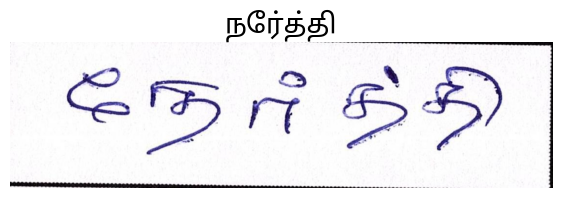

tensor([[  0,   0, 280, 302, 575, 265, 273, 263,   2]], device='cuda:0')


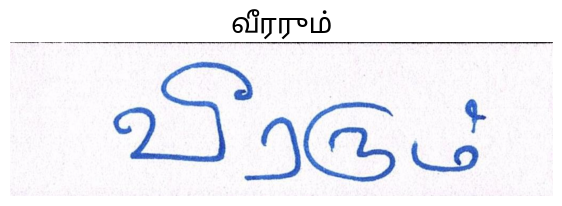

tensor([[   0,    0, 2391,  265,  268,  265,  559,  263,  285,  265,  267,  263,
          267,  265,    2]], device='cuda:0')


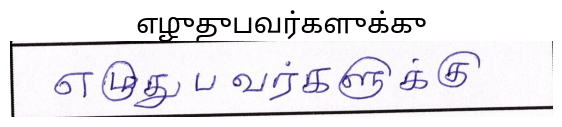

tensor([[  0,   0, 273, 294, 274, 263, 274,   2]], device='cuda:0')


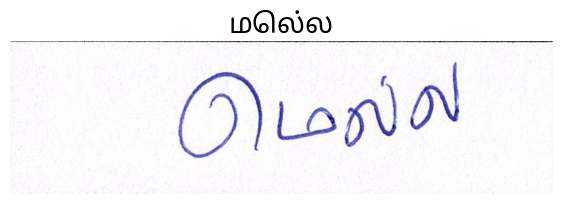

tensor([[   0,    0, 1085,  263,  271,  294,  269,  263,  289,  294,  271,  263,
            2]], device='cuda:0')


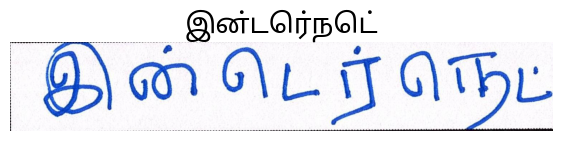

tensor([[   0,    0,  483, 2566,  263,  285,  266,  274,  263,    2]],
       device='cuda:0')


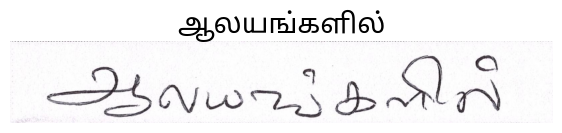

tensor([[   0,    0,  267,  265,  278,  266, 2292,  276,  277,  266,  274,  266,
          269,  265,  289,  263,  268,  265,    2]], device='cuda:0')


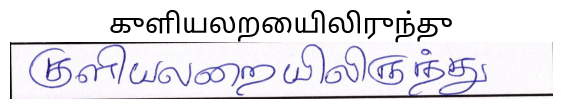

tensor([[  0,   0, 316, 263, 273, 270,   2]], device='cuda:0')


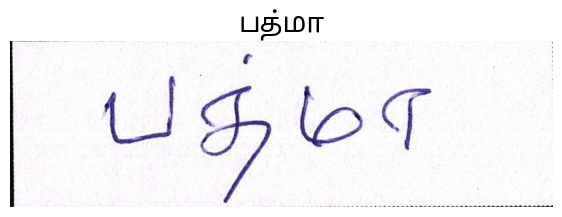

tensor([[   0,    0, 1418,  263,  275,  306,  273,  266,  277,  266,  274,  263,
            2]], device='cuda:0')


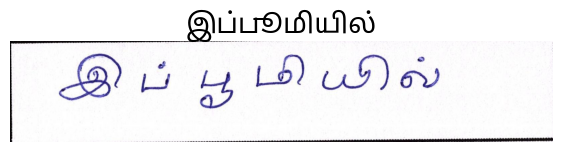

tensor([[   0,    0, 2611,  265,  267,  263,  267,  265,  278,  263,    2]],
       device='cuda:0')


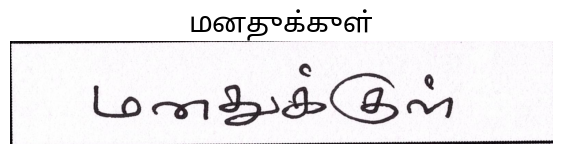

tensor([[   0,    0,  286,  294, 6227,  266,  347,  270,  336,  265,  273,  263,
            2]], device='cuda:0')


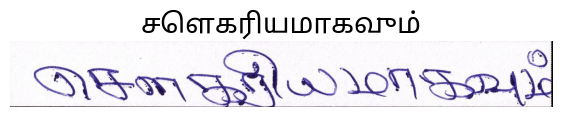

tensor([[  0,   0, 467, 266, 275, 263, 275, 266, 271,   2]], device='cuda:0')


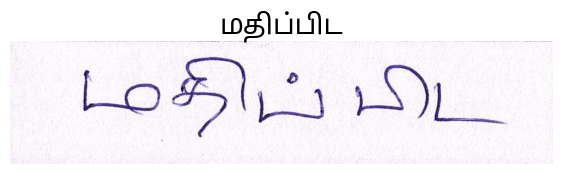

tensor([[  0,   0, 268, 302, 299, 263, 267, 265, 273, 263,   2]],
       device='cuda:0')


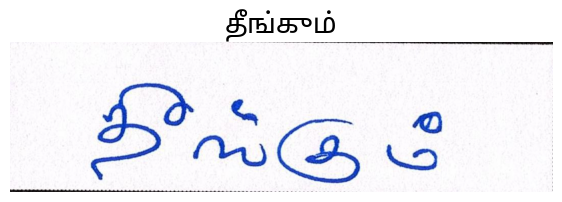

tensor([[  0,   0, 275, 306, 275, 263, 316, 265, 275, 296, 274, 263,   2]],
       device='cuda:0')


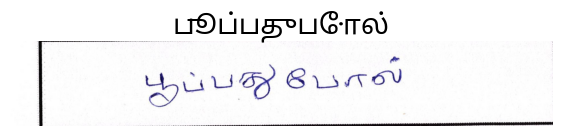

tensor([[   0,    0, 3061,  263,  290,  266,  272,  263,    2]],
       device='cuda:0')


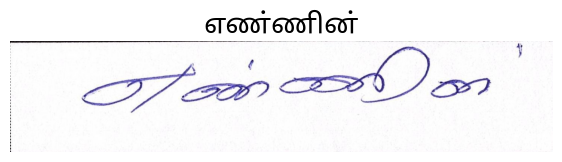

tensor([[  0,   0, 267, 265, 271, 266, 277, 266, 269, 265, 275, 263, 275, 265,
         268, 263,   2]], device='cuda:0')


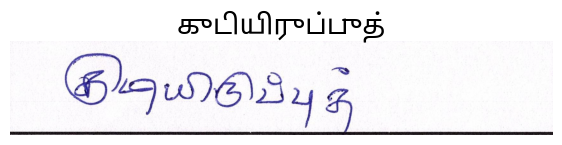

tensor([[  0,   0, 275, 265, 275, 263, 316, 265, 275, 296, 274, 263,   2]],
       device='cuda:0')


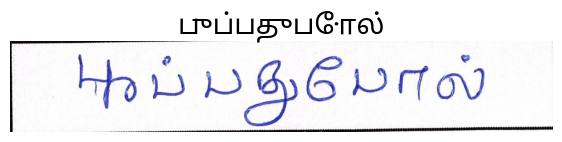

tensor([[  0,   0, 286, 266, 269, 266, 267, 263, 267, 266, 279, 270, 272, 263,
           2]], device='cuda:0')


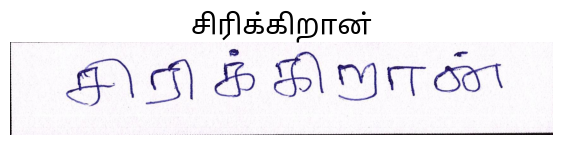

tensor([[  0,   0, 477, 266, 346, 263, 285, 265, 267, 263, 267, 265, 268, 263,
           2]], device='cuda:0')


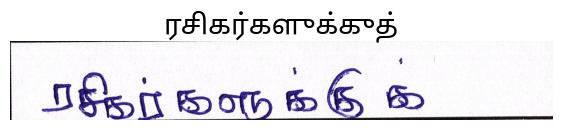

tensor([[  0,   0, 428, 266, 272, 263, 272, 265,   2]], device='cuda:0')


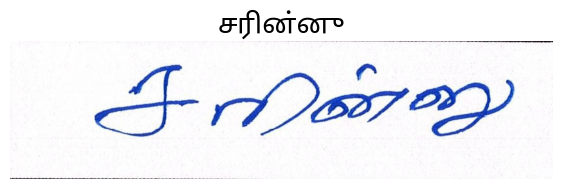

tensor([[  0,   0, 280, 294, 278, 266, 277, 287, 279, 266, 272, 270, 269, 263,
           2]], device='cuda:0')


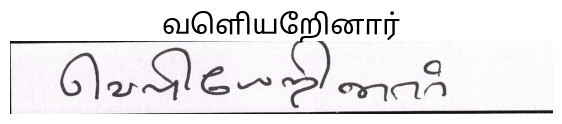

tensor([[   0,    0, 3588,  263,  409,  263,  472,  276,    2]],
       device='cuda:0')


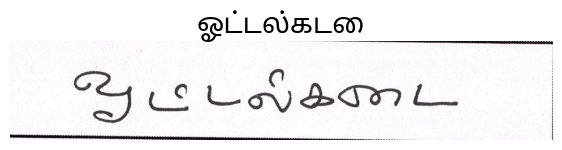

tensor([[    0,     0, 14005,   263,   286,   265,     2]], device='cuda:0')


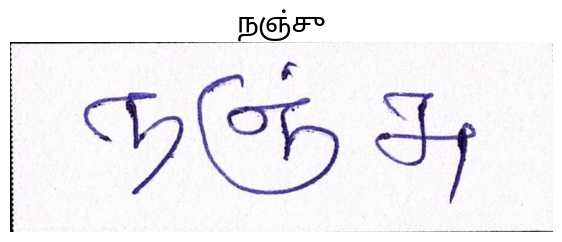

tensor([[  0,   0, 477, 266, 267, 263, 267, 266, 279,   2]], device='cuda:0')


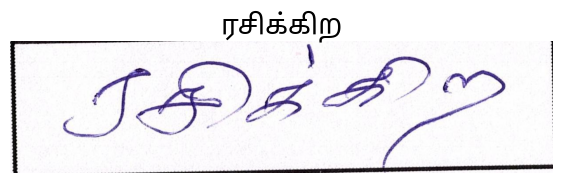

tensor([[  0,   0, 267, 287, 274, 266, 267, 263, 267, 265, 269, 266, 345, 265,
           2]], device='cuda:0')


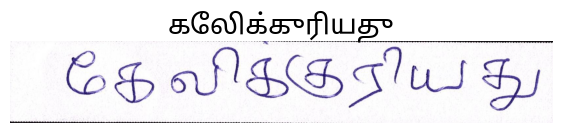

tensor([[  0,   0, 275, 265, 268, 276,   2]], device='cuda:0')


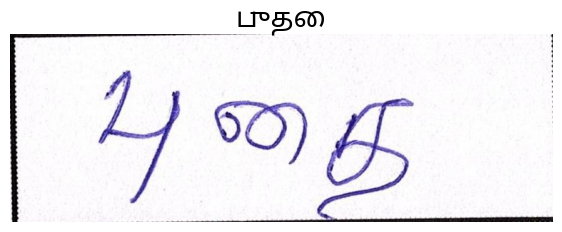

tensor([[   0,    0, 1848,  266,  280,  270,  272,  263,    2]],
       device='cuda:0')


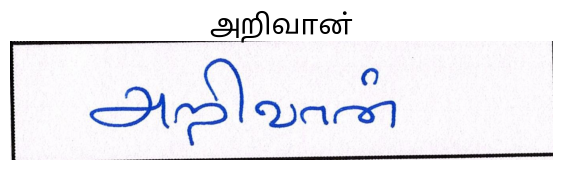

tensor([[   0,    0, 1665,  263,  304,  266,  275,  263,  304,  263,  746,  263,
            2]], device='cuda:0')


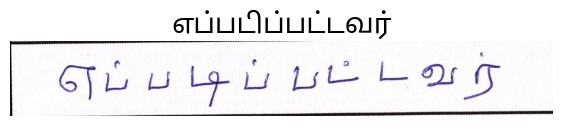

tensor([[   0,    0, 4303,  263,  327,  263,  304,  265,  267,  266,  321,  265,
            2]], device='cuda:0')


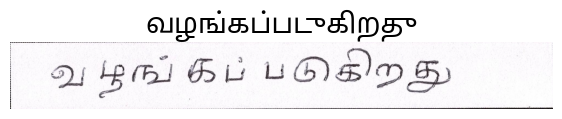

tensor([[  0,   0, 275, 306, 901, 266, 275, 263,   2]], device='cuda:0')


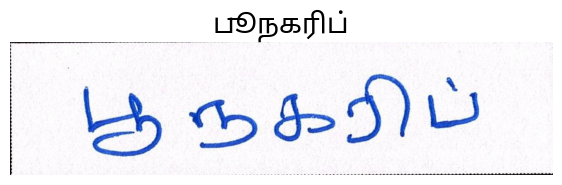

tensor([[    0,     0, 15422,   266,   350,   270,   272,     2]],
       device='cuda:0')


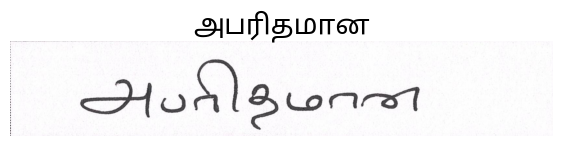

tensor([[   0,    0,  275,  265,  441,  263, 4568,  265,  299,  263,  285,  263,
            2]], device='cuda:0')


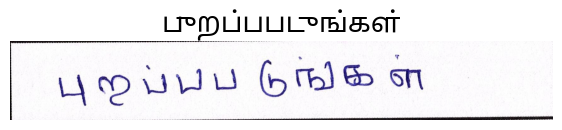

tensor([[   0,    0, 1521,  276, 6537,  263,  267,    2]], device='cuda:0')


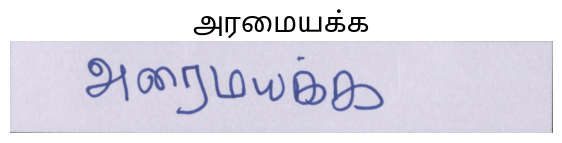

tensor([[  0,   0, 280, 266, 277, 270, 275, 270, 269, 266, 277, 266, 272, 263,
           2]], device='cuda:0')


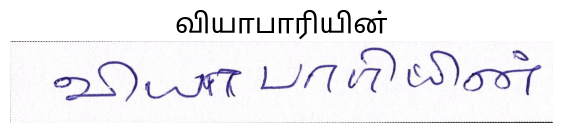

tensor([[   0,    0, 4405,  263,  268,  270,  272,    2]], device='cuda:0')


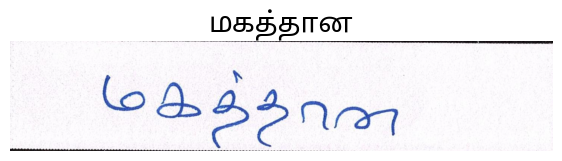

tensor([[   0,    0, 6053,  263,  275,  294,  279,  263,  279,  265,  278,  263,
          278,    2]], device='cuda:0')


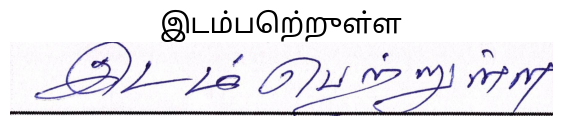

tensor([[   0,    0, 7448,  263,  267,  265,    2]], device='cuda:0')


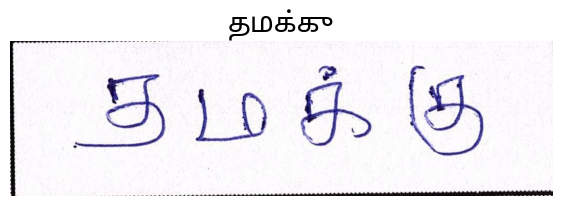

tensor([[  0,   0, 289, 266, 321, 263, 268, 266, 279, 263, 267, 265, 273, 263,
           2]], device='cuda:0')


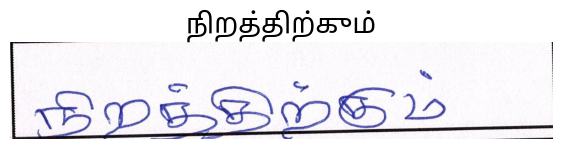

tensor([[  0,   0, 286, 266, 279, 265, 286, 266, 274, 265, 280, 294, 272, 263,
         279, 265,   2]], device='cuda:0')


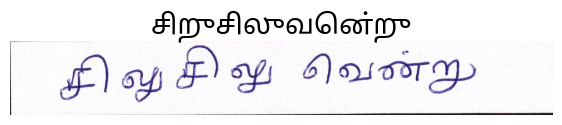

tensor([[  0,   0, 344, 263, 272, 265, 271, 276, 345, 265,   2]],
       device='cuda:0')


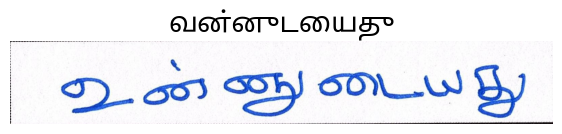

tensor([[   0,    0, 5337,  263,  317,  266,    2]], device='cuda:0')


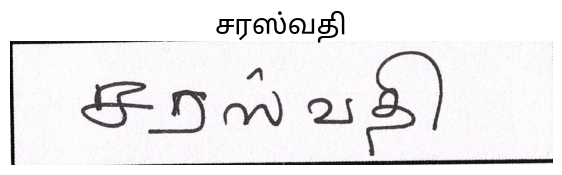

tensor([[    0,     0, 11531,   276,   268,   263,   268,   266,   269,   265,
           289,   270,   278,   263,     2]], device='cuda:0')


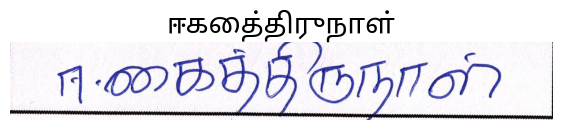

tensor([[   0,    0,  286,  266, 4380,  266,  277,  270,  269,  263,  285,  263,
            2]], device='cuda:0')


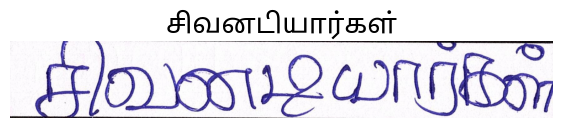

tensor([[   0,    0, 3214,  276,  267,  263,  336,  266,  274,  263,  274,  276,
            2]], device='cuda:0')


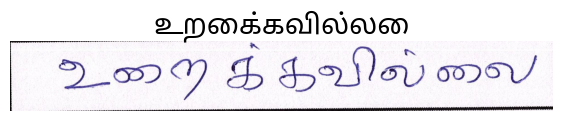

tensor([[  0,   0, 267, 306, 275, 263, 275, 266, 599, 266, 274, 263, 274, 276,
           2]], device='cuda:0')


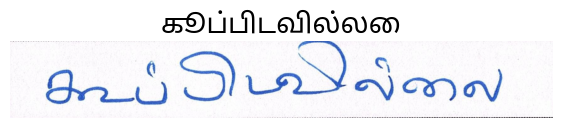

tensor([[  0,   0, 280, 266, 278, 276, 277, 270, 271, 263, 271, 265, 268, 263,
           2]], device='cuda:0')


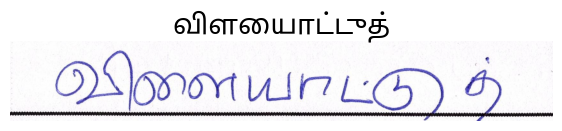

tensor([[   0,    0, 3766,  263,  267,  266,  345,  263,  268,  296,  271,  265,
            2]], device='cuda:0')


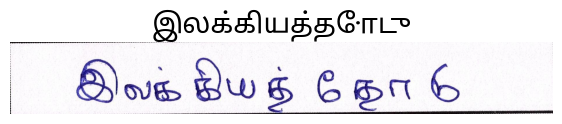

tensor([[   0,    0, 1339,  460,  263,    2]], device='cuda:0')


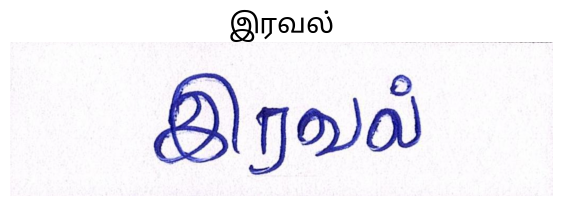

tensor([[   0,    0,  275,  266,  333,  263, 1273,  265,  269,  302,  314,  263,
         1579,  263,    2]], device='cuda:0')


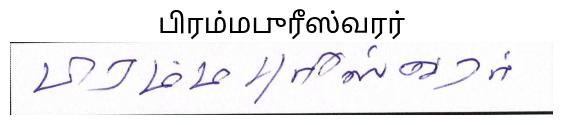

tensor([[  0,   0, 267, 300, 278, 263, 317, 266, 274, 263,   2]],
       device='cuda:0')


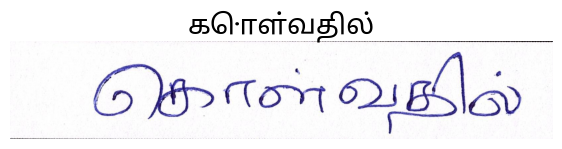

tensor([[    0,     0, 21867,   300,   301,   266,   274,   263,   285,   270,
           267,     2]], device='cuda:0')


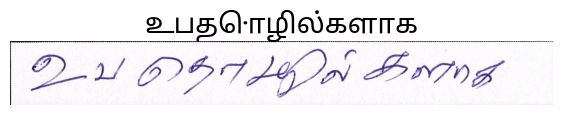

tensor([[  0,   0, 273, 302, 278, 263, 275, 270, 269, 263, 280, 276,   2]],
       device='cuda:0')


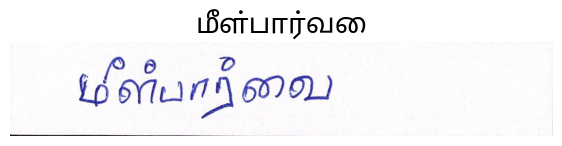

tensor([[  0,   0, 273, 287, 279, 263, 267, 300, 290, 263, 271, 266, 269, 265,
         267, 263, 267, 266, 279, 270, 269, 263, 285, 263,   2]],
       device='cuda:0')


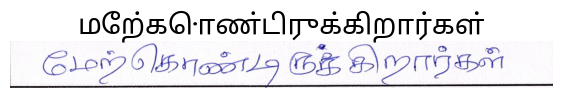

tensor([[  0,   0, 280, 266, 674, 270, 277, 266, 285, 266, 272, 263,   2]],
       device='cuda:0')


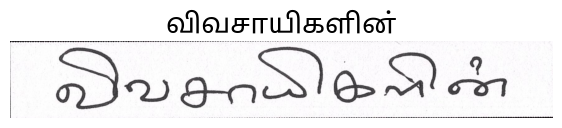

tensor([[  0,   0, 286, 294, 280, 266, 274, 266,   2]], device='cuda:0')


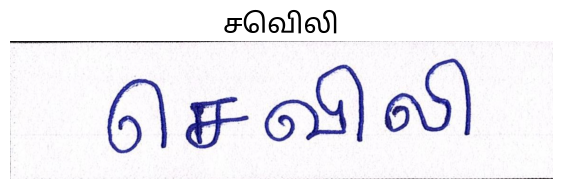

tensor([[   0,    0, 1390,  266,    2]], device='cuda:0')


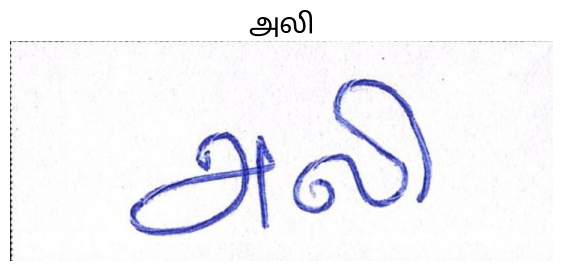

tensor([[   0,    0, 1863,  266,  277,  265,  273,  263,    2]],
       device='cuda:0')


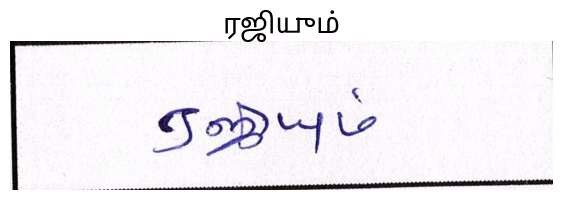

tensor([[  0,   0, 268, 265, 290, 276, 277, 270, 336, 265, 273, 263,   2]],
       device='cuda:0')


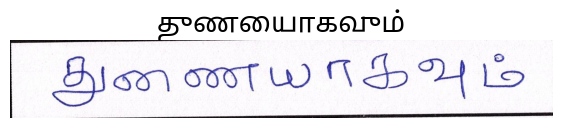

tensor([[   0,    0,  367,  266,  289, 1587,  274,  270,  267,    2]],
       device='cuda:0')


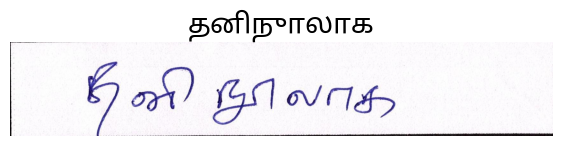

tensor([[   0,    0, 3801,  287,  486,  263,  268,  266,  274,  263,    2]],
       device='cuda:0')


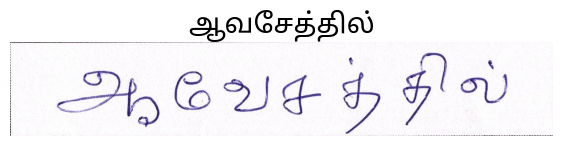

tensor([[  0,   0, 273, 300, 268, 263, 268,   2]], device='cuda:0')


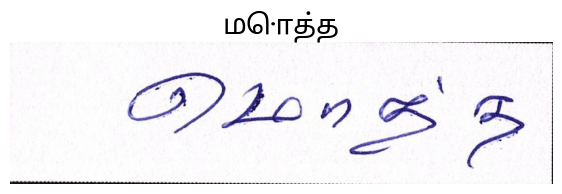

tensor([[  0,   0, 286, 266, 804, 294, 269, 265, 273, 270, 272, 266, 272, 263,
           2]], device='cuda:0')


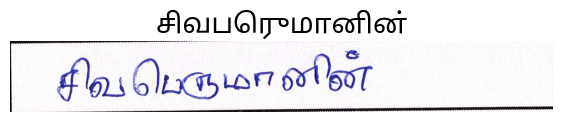

tensor([[  0,   0, 289, 287, 275, 270, 278, 263,   2]], device='cuda:0')


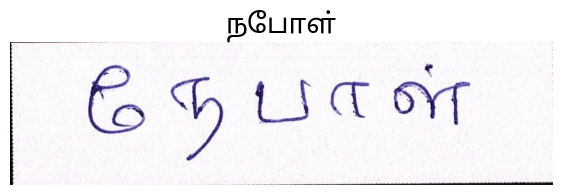

tensor([[  0,   0, 275, 300, 269, 265, 289, 263, 268, 265, 317, 266, 274, 263,
         274, 276,   2]], device='cuda:0')


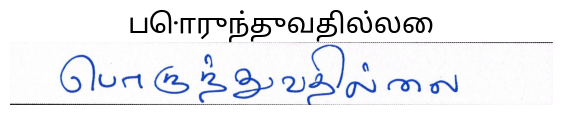

tensor([[  0,   0, 267, 270, 272, 263, 314, 263, 340, 263, 271, 276, 272, 263,
           2]], device='cuda:0')


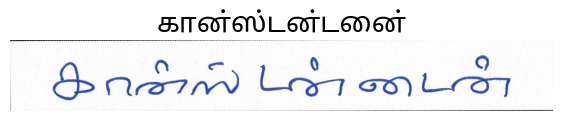

tensor([[   0,    0, 1848,  266,  289,  263,  331,  265,    2]],
       device='cuda:0')


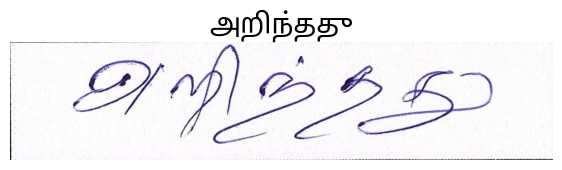

tensor([[  0,   0, 593, 266, 268, 263, 567, 263,   2]], device='cuda:0')


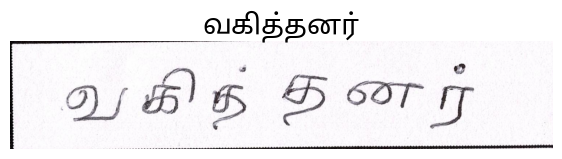

tensor([[  0,   0, 267, 296, 271, 263, 275, 270, 271, 270, 267, 265, 273, 263,
           2]], device='cuda:0')


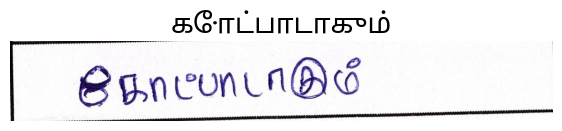

tensor([[   0,    0, 2173,  263,  279,  265,  268,  263,    2]],
       device='cuda:0')


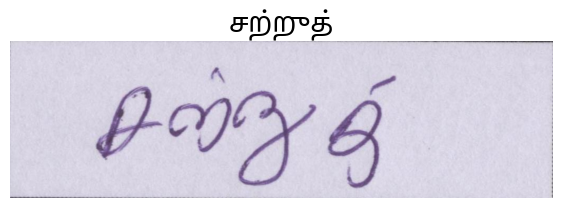

tensor([[  0,   0, 280, 276, 268, 263, 268, 265, 278, 263, 349, 265,   2]],
       device='cuda:0')


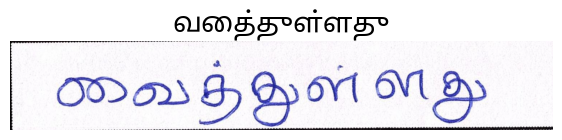

tensor([[  0,   0, 698, 266, 277, 270, 267, 266, 277, 265, 278, 263, 576, 287,
           2]], device='cuda:0')


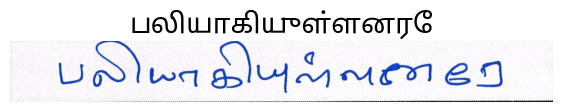

tensor([[    0,     0, 17575, 23633,   263,     2]], device='cuda:0')


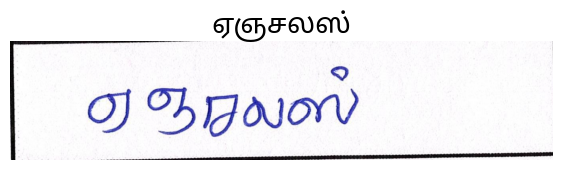

tensor([[  0,   0, 286, 270, 348, 263,   2]], device='cuda:0')


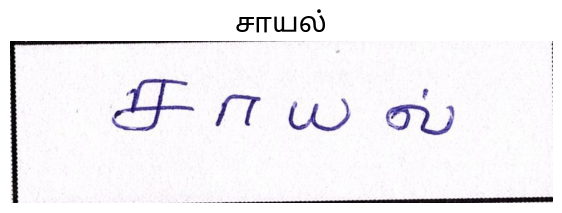

tensor([[  0,   0, 289, 266, 273, 263, 467, 266, 277, 270, 277, 263,   2]],
       device='cuda:0')


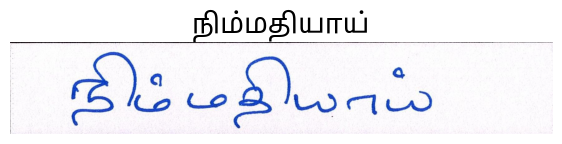

tensor([[  0,   0, 267, 265, 497, 263, 268, 276, 273, 276,   2]],
       device='cuda:0')


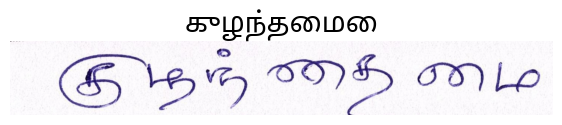

tensor([[  0,   0, 412, 270, 268, 270, 425, 263,   2]], device='cuda:0')


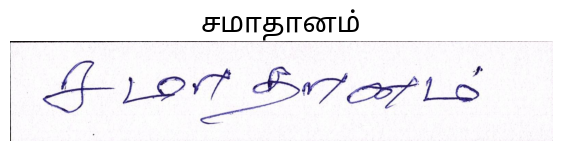

tensor([[  0,   0, 273, 270, 277, 270,   2]], device='cuda:0')


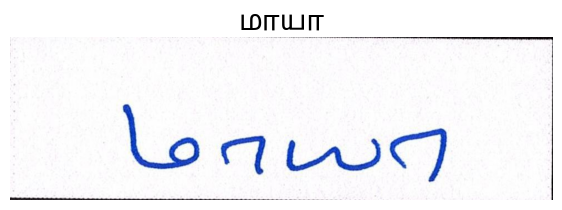

tensor([[  0,   0, 267, 266, 278, 270, 314, 263, 285, 266, 274, 263,   2]],
       device='cuda:0')


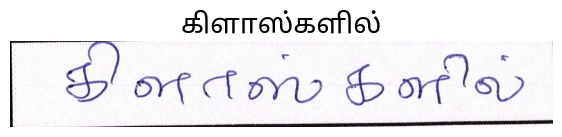

tensor([[   0,    0,  268,  294,  269,  266, 3423,  270,    2]],
       device='cuda:0')


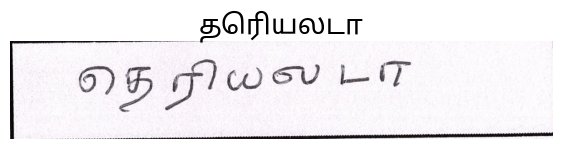

tensor([[  0,   0, 335, 263, 268, 296, 274, 266, 267, 263, 485, 263,   2]],
       device='cuda:0')


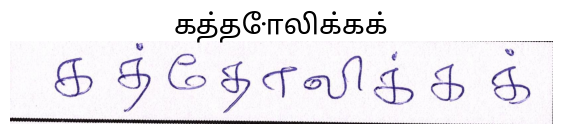

tensor([[   0,    0,  286,  270, 2630,    2]], device='cuda:0')


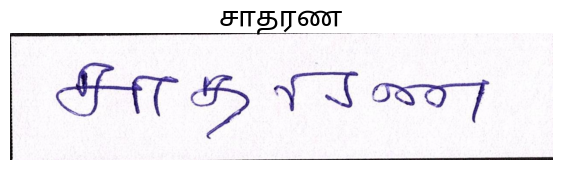

In [ ]:

# Find the Tamil font path
tamil_font_path = fm.findSystemFonts(fontpaths=None, fontext='ttf')
#tamil_font_path = [font for font in tamil_font_path if 'NotoSansTamil' in font][0] # find the first NotoSansTamil font
tamil_font_paths = [font for font in tamil_font_path if 'NotoSansTamil' in font]

# Create a FontProperties object with the Tamil font
# Check if the font is found
if tamil_font_paths:
    tamil_font_path = tamil_font_paths[0] # find the first NotoSansTamil font
    tamil_font = fm.FontProperties(fname=tamil_font_path)
else:
    print("Warning: NotoSansTamil font not found. Using default font.")
    tamil_font = fm.FontProperties() # Use default font

def eval_new_data(
    data_path=os.path.join('/content/', 'val', '*'),
    num_samples=50
):
    image_paths = glob.glob(data_path)
    print(f"Found {len(image_paths)} images.")
    for i, image_path in tqdm(enumerate(image_paths), total=50):#len(image_paths)):
        if i == num_samples:
            break
        image = read_and_show(image_path)
        text = ocr_new(image, processor, trained_model1)
        #print(text)
        plt.figure(figsize=(7, 4))
        plt.imshow(image)
        plt.title(text,fontproperties=font_tamil)
        plt.axis('off')
        plt.show()

eval_new_data(
    data_path=os.path.join(DatasetConfig.DATA_ROOT, 'train', '*'),
    num_samples=100
)

In [ ]:
from google.colab import runtime
runtime.unassign()
